In [1]:
import cupy as cp
import cupyx
import scanpy as sc
import numpy as np
from cupyx.scipy.sparse import csr_matrix
import os
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import random
import pandas as pd
from rsc_functions.utility.applyqc import applyqc
from rsc_functions.reports.plot import plot_spatial,plot_spatial_data, plot_dist
from rsc_functions.utility.rank_genes_groups import return_markers,rank_genes_groups
from rsc_functions.reports.plot import plot_expression

In [2]:
path_016 = "/data/kanferg/Sptial_Omics/playGround/Data/Visium_HD_Human_Colon_Cancer_binned_outputs/binned_outputs/square_016um"
pathout = "/data/kanferg/Sptial_Omics/SpatialOmicsToolkit/out_2"
andata = sc.read_h5ad(os.path.join(pathout, "andata_save_colon.h5ad"))
def load_matrix(andata,pathout,npz_file = "obsp_distances.npz",mode = 'sparse', mat_name = 'distances'):
    npzfile = cp.load(os.path.join(pathout, npz_file))
    data = cp.array(npzfile['data'])
    indices = cp.array(npzfile['indices'])
    indptr = cp.array(npzfile['indptr'])
    shape = tuple(npzfile['shape'])
    
    # Reconstruct the sparse matrix
    sparse_matrix_distances = csr_matrix((data, indices, indptr), shape=shape)
    if mode== 'sparse':
        andata.obsp[mat_name] = sparse_matrix_distances
    else:
        andata.obsp[mat_name] = sparse_matrix_distances.get()
    return andata

In [3]:
andata.obs["imagerow"] = andata.obsm['spatial'][:,0]
andata.obs["imagecol"] = andata.obsm['spatial'][:,1]
andata.uns["spatial"] = andata.obsm["spatial"]
def make_uns_spatial(adata):
    #max_size = np.max([adata.obs["imagerow"].max(), adata.obs["imagecol"].max()])
    #max_size = int(max_size + 0.1 * max_size)
    #image = Image.new("RGBA", (max_size, max_size), (255, 255, 255, 255))
    #imgarr = np.array(image)
    adata.uns["spatial"] = {}
    adata.uns["spatial"]["id1"] = {}
    #adata.uns["spatial"]["id1"]["images"] = {}
    #adata.uns["spatial"]["id1"]["images"]["lowres"] = imgarr
    adata.uns["spatial"]["id1"]["use_quality"] = "lowres"
    adata.uns["spatial"]["id1"]["scalefactors"] = {}
    adata.uns["spatial"]["id1"]["scalefactors"]["tissue_low_scalef" ] = 1
    adata.uns["spatial"]["id1"]["scalefactors"]["spot_diameter_fullres"] = 15
    adata.uns["spatial"]["id1"]["scalefactors"][
            "tissue_" + "lowres" + "_scalef"
        ] = 1
    return adata
andata = make_uns_spatial(andata)

In [4]:
andata = load_matrix(andata,pathout,npz_file = "obsp_distances_large_colon.npz",mode = 'sparse', mat_name = 'distances')
andata = load_matrix(andata,pathout,npz_file = "obsp_connectivities_large_colon.npz",mode = 'sparse', mat_name = 'connectivities')

In [5]:
import os
import pickle

file_path = os.path.join(pathout, "andata_uns_mtracies__colon.pkl")

if os.path.getsize(file_path) > 0:
    with open(file_path, 'rb') as buff:
        andata_uns_mtracies = pickle.load(buff)
else:
    print("File is empty. Cannot load data.")
    andata_uns_mtracies = None
andata.uns["spatial"] = andata.obsm["spatial"]
andata.uns['clusterColorMap'] = andata_uns_mtracies['clusterColorMap']
andata.obs["imagerow"] = andata.obsm['spatial'][:,0]
andata.obs["imagecol"] = andata.obsm['spatial'][:,1]
andata.uns["spatial"] = andata.obsm["spatial"]

In [6]:
df = pd.DataFrame({'cluster':andata.obs['cluster'],'x':andata.obsm['spatial'][:,0],'y':andata.obsm['spatial'][:,1]})
color_map = andata.uns['clusterColorMap'].set_index('clusters')['colors'].to_dict()
color_map

{'10': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392, 1.0),
 '12': (0.9058823529411765, 0.7294117647058823, 0.3215686274509804, 1.0),
 '1': (0.9058823529411765, 0.5882352941176471, 0.611764705882353, 1.0),
 '13': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0),
 '9': (0.7372549019607844, 0.7411764705882353, 0.13333333333333333, 1.0),
 '2': (0.6313725490196078, 0.8509803921568627, 0.6078431372549019, 1.0),
 '3': (0.9686274509803922, 0.7137254901960784, 0.8235294117647058, 1.0),
 '5': (0.4549019607843137, 0.7686274509803922, 0.4627450980392157, 1.0),
 '8': (0.7764705882352941, 0.8588235294117647, 0.9372549019607843, 1.0),
 '0': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313, 1.0),
 '4': (0.5176470588235295, 0.23529411764705882, 0.2235294117647059, 1.0),
 '11': (0.5882352941176471, 0.5882352941176471, 0.5882352941176471, 1.0),
 '7': (0.4196078431372549, 0.6823529411764706, 0.8392156862745098, 1.0),
 '14': (0.8588235294117647, 0.858823529411

In [7]:
df['color'] = df['cluster'].astype(str).map(color_map)

/tmp/ipykernel_492054/2124183572.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_temp = cluster_data['color'][0]


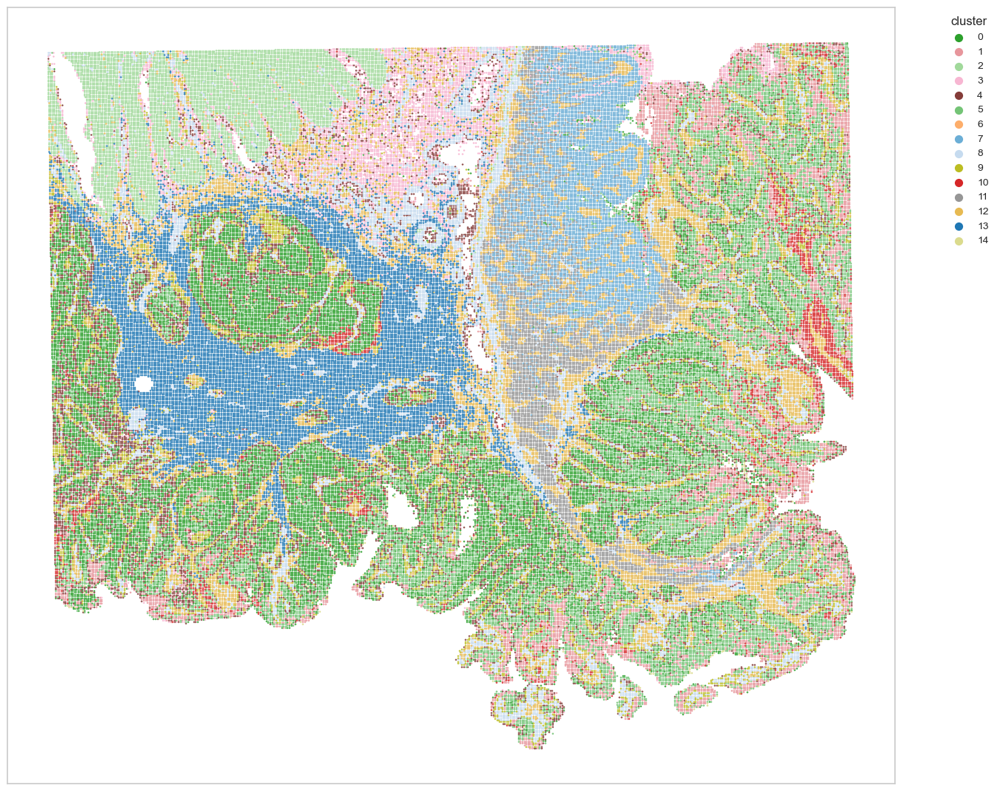

In [68]:
sns.set_theme(style="whitegrid", palette="pastel")
color_container = []

fig, ax = plt.subplots(1, 1, figsize=(15,15))
clusters = sorted(np.unique(df['cluster'].values), key=int)
for i, cluster in enumerate(clusters):
    cluster_data = df[df['cluster'] == cluster]
    color_temp = cluster_data['color'][0]
    ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=1)

ax.set_xticks([])
ax.set_yticks([])
# ax.set_xlabel(xlab)
# ax.set_ylabel(ylab)
# ax.set_title(title)
legend = ax.legend(title='cluster',
                    bbox_to_anchor=(1.05, 1),  # Position the legend outside the plot
                    loc='upper left',
                    fontsize='small',  # Control the font size
                    title_fontsize='medium',
                     markerscale=10,  # Increase the size of the legend markers
                    frameon=False)
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)

In [71]:
with PdfPages(os.path.join(pathout, f'Report_spatial_map_plot_colon.pdf')) as pdf:
    plt.rcParams['figure.dpi'] = 600
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    fig, ax = plt.subplots(1,1, figsize=(15, 15))
    color_container = []
    clusters = sorted(np.unique(df['cluster'].values), key=int)
    for i, cluster in enumerate(clusters):
        cluster_data = df[df['cluster'] == cluster]
        color_temp = cluster_data['color'][0]
        ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=1)
    
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.set_xlabel(xlab)
    # ax.set_ylabel(ylab)
    # ax.set_title(title)
    legend = ax.legend(title='cluster',
                        bbox_to_anchor=(1.05, 1),  # Position the legend outside the plot
                        loc='upper left',
                        fontsize='small',  # Control the font size
                        title_fontsize='medium',
                         markerscale=10,  # Increase the size of the legend markers
                        frameon=False)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

/tmp/ipykernel_492054/133432738.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_temp = cluster_data['color'][0]


In [ ]:
'CEACAM6', 'COL1A1', 'MMP2', 'SAT1', 'TGFBI'

In [64]:
marker_genes = {
    "Goblet cells": ["FCGBP", "MUC2", "CLCA1"],
    # Note: DMXL2 should be negative
    "Macrophages": ["LYZ", "SPP1"],
    # Note HBM and GYPA are negative markers
    "Tumor": ["REG1A", "REG1B"],
}

In [65]:
andata

AnnData object with n_obs × n_vars = 133282 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster', 'imagerow', 'imagecol'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'spatial', 'clusterColorMap'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'log'
    obsp: 'distances', 'connectivities'

In [66]:
andata.var_names

Index(['HES4', 'ISG15', 'MXRA8', 'ANKRD65', 'MMP23B', 'MEGF6', 'SPSB1',
       'PIK3CD', 'ANGPTL7', 'PDPN',
       ...
       'SMIM10', 'FHL1', 'BGN', 'PNCK', 'PDZD4', 'L1CAM', 'DDX3Y', 'UTY',
       'KDM5D', 'EIF1AY'],
      dtype='object', length=1500)

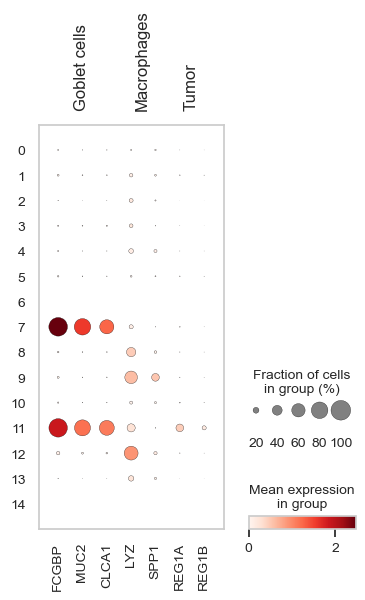

In [67]:
sc.pl.dotplot(andata, marker_genes, groupby="cluster")

In [76]:
sns.set_theme(style="whitegrid", palette="pastel")
color_container = []

fig, ax = plt.subplots(1, 1, figsize=(15,15))
clusters = sorted(np.unique(df['cluster'].values), key=int)
for i, cluster in enumerate(clusters):
    cluster_data = df[df['cluster'] == cluster]
    color_temp = cluster_data['color'][0]
    ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=1)

ax.set_xticks([])
ax.set_yticks([])
# ax.set_xlabel(xlab)
# ax.set_ylabel(ylab)
# ax.set_title(title)
legend = ax.legend(title='cluster',
                    bbox_to_anchor=(1.05, 1),  # Position the legend outside the plot
                    loc='upper left',
                    fontsize='small',  # Control the font size
                    title_fontsize='medium',
                     markerscale=10,  # Increase the size of the legend markers
                    frameon=False)
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)

/tmp/ipykernel_492054/932099298.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_temp = cluster_data['color'][0]


In [81]:
with PdfPages(os.path.join(pathout, f'Report_spatial_map_plot_colon_celltype_tumer_goblet.pdf')) as pdf:
    plt.rcParams['figure.dpi'] = 600
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    fig, ax = plt.subplots(1,1, figsize=(15, 15))
    clusters = sorted(np.unique(df['cluster'].values), key=int)
    for i, cluster in enumerate(clusters):
        cluster_data = df[df['cluster'] == cluster]
        color_temp = cluster_data['color'][0]
        if i==7:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label='Goblet cells', s=0.5, alpha=1)
        elif i == 11:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label="Tumor", s=0.5, alpha=1)
        elif i ==9:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label="Macrophages", s=0.5, alpha=1)
        else:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=0.05)
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.set_xlabel(xlab)
    # ax.set_ylabel(ylab)
    # ax.set_title(title)
    legend = ax.legend(title='cluster',
                        bbox_to_anchor=(1.2, 1),  # Position the legend outside the plot
                        loc='upper left',
                        fontsize='small',  # Control the font size
                        title_fontsize='medium',
                         markerscale=10,  # Increase the size of the legend markers
                        frameon=False)
    plt.subplots_adjust(left=0.1, right=0.75, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

/tmp/ipykernel_492054/1715735094.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_temp = cluster_data['color'][0]


In [ ]:
with PdfPages(os.path.join(pathout, f'Report_spatial_map_plot_colon_celltype.pdf')) as pdf:
    plt.rcParams['figure.dpi'] = 600
    plt.rcParams['font.family'] = ['serif']
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 12
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    fig, ax = plt.subplots(1,1, figsize=(15, 15))
    clusters = sorted(np.unique(df['cluster'].values), key=int)
    for i, cluster in enumerate(clusters):
        cluster_data = df[df['cluster'] == cluster]
        color_temp = cluster_data['color'][0]
        if i==7:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label='Goblet cells', s=0.5, alpha=1)
        elif i == 11:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label="Tumor", s=0.5, alpha=1)
        elif i ==9:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label="Macrophages", s=0.5, alpha=1)
        else:
            ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=1)
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.set_xlabel(xlab)
    # ax.set_ylabel(ylab)
    # ax.set_title(title)
    legend = ax.legend(title='cluster',
                        bbox_to_anchor=(1.2, 1),  # Position the legend outside the plot
                        loc='upper left',
                        fontsize='small',  # Control the font size
                        title_fontsize='medium',
                         markerscale=10,  # Increase the size of the legend markers
                        frameon=False)
    plt.subplots_adjust(left=0.1, right=0.75, top=0.9, bottom=0.2)
    pdf.savefig()
    plt.close()

In [39]:
marker_genes

{'Goblet cells': ['FCGBP', 'MUC2', 'CLCA1'],
 'Macrophages': ['LYZ', 'SPP1'],
 'Tumor': ['REG1A', 'REG1B']}

In [40]:
andata.uns['clusterColorMap']['clusters'].replace({})

0     10
1     12
2      1
3     13
4      9
5      2
6      3
7      5
8      8
9      0
10     4
11    11
12     7
13    14
14     6
Name: clusters, dtype: category
Categories (15, object): ['0', '1', '2', '3', ..., '11', '12', '13', '14']

In [41]:
andata.obs["cluster"].map(lambda x: marker_genes.get(x, x))

s_016um_00010_00367-1    10
s_016um_00163_00399-1    12
s_016um_00238_00388-1     1
s_016um_00144_00175-1    13
s_016um_00347_00254-1     9
                         ..
s_016um_00193_00227-1    12
s_016um_00375_00231-1     9
s_016um_00109_00223-1    12
s_016um_00039_00175-1    12
s_016um_00144_00329-1    12
Name: cluster, Length: 133282, dtype: category
Categories (15, object): ['0', '1', '2', '3', ..., '11', '12', '13', '14']

In [48]:
maping =  {
        "7": "Goblet cells",
        "9": "Macrophages",
        "11": "Tum0r",
    }

In [49]:
andata.uns['clusterColorMap']['clusters'] = andata.uns['clusterColorMap']['clusters'].map(lambda x: maping.get(x, x))

In [50]:
andata.obs['cluster'] = andata.obs['cluster'].map(lambda x: maping.get(x, x))

In [51]:
df = pd.DataFrame({'cluster':andata.obs['cluster'],'x':andata.obsm['spatial'][:,0],'y':andata.obsm['spatial'][:,1]})
color_map = andata.uns['clusterColorMap'].set_index('clusters')['colors'].to_dict()
df['color'] = df['cluster'].astype(str).map(color_map)

In [55]:
np.sort(np.unique(df['cluster'].values)) 

array(['0', '1', '10', '12', '14', '2', '3', '4', '5', '6', '8',
       'Goblet cells', 'Macrophages', 'Tum0r'], dtype=object)

/tmp/ipykernel_492054/1911094991.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_temp = cluster_data['color'][0]


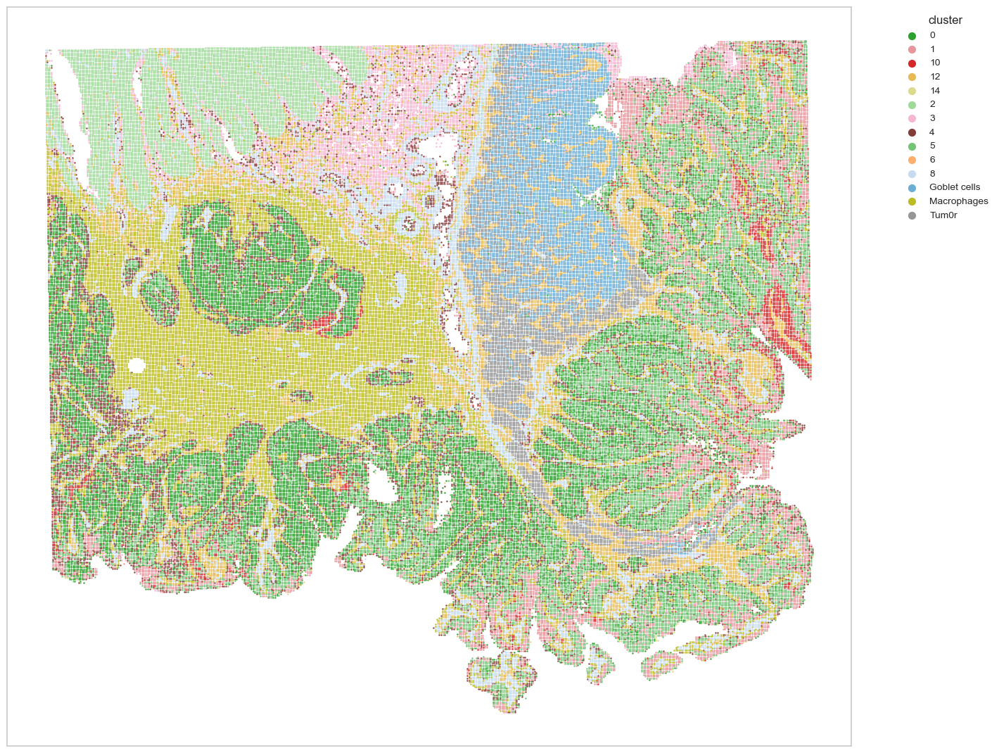

In [53]:
sns.set_theme(style="whitegrid", palette="pastel")
color_container = []

fig, ax = plt.subplots(1, 1, figsize=(15,15))
clusters = np.unique(df['cluster'].values)
for i, cluster in enumerate(clusters):
    cluster_data = df[df['cluster'] == cluster]
    color_temp = cluster_data['color'][0]
    ax.scatter( x=cluster_data['x'], y=cluster_data['y'], color=color_temp, label=f'{cluster}', s=0.5, alpha=1)
    
ax.set_xticks([])
ax.set_yticks([])
# ax.set_xlabel(xlab)
# ax.set_ylabel(ylab)
# ax.set_title(title)
legend = ax.legend(title='cluster',
                    bbox_to_anchor=(1.05, 1),  # Position the legend outside the plot
                    loc='upper left',
                    fontsize='small',  # Control the font size
                    title_fontsize='medium',
                     markerscale=10,  # Increase the size of the legend markers
                    frameon=False# Control the title font size
                    )
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)


In [89]:
andata

AnnData object with n_obs × n_vars = 133282 × 1500
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_MT', 'pct_counts_MT', 'log1p_total_counts_MT', 'cluster', 'imagerow', 'imagecol'
    var: 'gene_ids', 'feature_types', 'genome', 'MT', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'spatial', 'clusterColorMap', 'rank_genes_groups', 'tumer_analysis'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'log'
    obsp: 'distances', 'connectivities'

In [8]:
sc.tl.rank_genes_groups(andata, groupby="cluster",reference = "7",groups = ["11"],tie_correct = True ,method='wilcoxon',key_added = 'tumer_analysis',layers = 'log',corr_method = 'bonferroni')

/usr/local/apps/rapids-singlecell/mamba/envs/rapids_singlecell/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:314: RuntimeWarning: invalid value encountered in divide
  scores = (


In [9]:
pd.DataFrame(andata.uns['tumer_analysis']['names']).loc[:,'11'].values

array(['OLFM4', 'DMBT1', 'REG1A', ..., 'MT2A', 'CA2', 'SLC26A3'],
      dtype=object)

In [10]:
andata.uns['tumer_analysis']

{'params': {'groupby': 'cluster',
  'reference': '7',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': None,
  'corr_method': 'bonferroni'},
 'names': rec.array([('OLFM4',), ('DMBT1',), ('REG1A',), ..., ('MT2A',), ('CA2',),
            ('SLC26A3',)],
           dtype=[('11', 'O')]),
 'scores': rec.array([( 59.66681 ,), ( 50.886272,), ( 45.725834,), ...,
            (-46.19386 ,), (-47.453693,), (-49.929802,)],
           dtype=[('11', '<f4')]),
 'pvals': rec.array([(0.,), (0.,), (0.,), ..., (0.,), (0.,), (0.,)],
           dtype=[('11', '<f8')]),
 'pvals_adj': rec.array([(0.,), (0.,), (0.,), ..., (0.,), (0.,), (0.,)],
           dtype=[('11', '<f8')]),
 'logfoldchanges': rec.array([( 2.9934354,), ( 3.3017542,), ( 5.5583572,), ...,
            (-2.1752458,), (-1.952442 ,), (-3.9795651,)],
           dtype=[('11', '<f4')])}

In [11]:
df = pd.DataFrame({"genes":pd.DataFrame(andata.uns['tumer_analysis']['names']).loc[:,'11'].values,
                    "logFC":pd.DataFrame(andata.uns['tumer_analysis']['logfoldchanges']).loc[:,'11'].values,
                  "adj.P.Val":pd.DataFrame(andata.uns['tumer_analysis']['pvals_adj']).loc[:,'11'].values})

In [12]:
minn = df.loc[df['genes']=='REG1B','adj.P.Val'].values

In [13]:
np.random.randint(1000,100_000,12)

array([61564, 54384, 44517, 54518, 48950, 29733, 27902, 11883, 78260,
        3556, 20838, 14721])

In [14]:
min_con = []
for i in np.random.randint(10_000_00,100_000_00,len(df.iloc[df.loc[df['adj.P.Val']==0,'adj.P.Val'].index,2])):
    min_con.append(minn[0]*1/i)

In [15]:
min_con

[8.265953194957598e-209,
 2.00917470679394e-208,
 2.3568853761740257e-208,
 1.4296038383585195e-208,
 2.651126950830391e-208,
 1.6393635043460266e-208,
 1.4913721441055833e-208,
 5.997417856045715e-209,
 2.2570611302706395e-208,
 1.4129314984061777e-208,
 1.2288907717378504e-208,
 9.310354005431678e-209]

In [16]:
df.iloc[df.loc[df['adj.P.Val']==0,'adj.P.Val'].index,2] = min_con

In [17]:
#df['adj.P.Val'] = df['adj.P.Val'].replace(0, )
df

,genes,logFC,adj.P.Val
0,OLFM4,2.993435,8.265953e-209
1,DMBT1,3.301754,2.009175e-208
2,REG1A,5.558357,2.356885e-208
3,REG1B,7.287654,5.161190e-202
4,IGFBP5,1.877100,2.550905e-180
...,...,...,...
1495,PIGR,-0.744085,5.997418e-209
1496,ZG16,-2.703583,2.257061e-208
1497,MT2A,-2.175246,1.412931e-208
1498,CA2,-1.952442,1.228891e-208


(-10.0, 10.0)

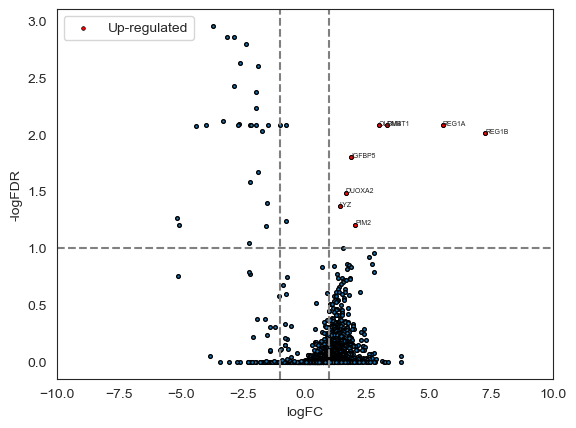

In [19]:
sns.set_style("white")
plt.scatter(x=df['logFC'],y=df['adj.P.Val'].apply(lambda x:-np.log10(x)*(1/100)),s=7,edgecolor='black')
plt.xlabel("logFC")
plt.ylabel("-logFDR")
#down = df[(df['logFC']<=-2)&(df['adj.P.Val'].apply(lambda x:-np.log10(x)*(1/100))<=2)]
up = df[(df['logFC']>=1)&(df['adj.P.Val'].apply(lambda x:-np.log10(x)*(1/100))>=1)]
#plt.scatter(x=down['logFC'],y=down['adj.P.Val'].apply(lambda x:-np.log10(x)*(1/100)),s=3,label="Down-regulated",color="blue")
plt.scatter(x=up['logFC'],y=up['adj.P.Val'].apply(lambda x:-np.log10(x)*(1/100)),s=7,label="Up-regulated",color="red",edgecolor='black', linewidth=0.5)
for i,r in up.iterrows():
    plt.text(x=r['logFC'],y=-np.log10(r['adj.P.Val'])*(1/100),s = r['genes'],fontsize=5)
plt.xlabel("logFC")
plt.ylabel("-logFDR")
plt.axvline(-1,color="grey",linestyle="--")
plt.axvline(1,color="grey",linestyle="--")
plt.axhline(1,color="grey",linestyle="--")
plt.legend(loc = 2)
plt.xlim(-10,10)

In [20]:
andata.uns['tumer_analysis']

{'params': {'groupby': 'cluster',
  'reference': '7',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': None,
  'corr_method': 'bonferroni'},
 'names': rec.array([('OLFM4',), ('DMBT1',), ('REG1A',), ..., ('MT2A',), ('CA2',),
            ('SLC26A3',)],
           dtype=[('11', 'O')]),
 'scores': rec.array([( 59.66681 ,), ( 50.886272,), ( 45.725834,), ...,
            (-46.19386 ,), (-47.453693,), (-49.929802,)],
           dtype=[('11', '<f4')]),
 'pvals': rec.array([(0.,), (0.,), (0.,), ..., (0.,), (0.,), (0.,)],
           dtype=[('11', '<f8')]),
 'pvals_adj': rec.array([(0.,), (0.,), (0.,), ..., (0.,), (0.,), (0.,)],
           dtype=[('11', '<f8')]),
 'logfoldchanges': rec.array([( 2.9934354,), ( 3.3017542,), ( 5.5583572,), ...,
            (-2.1752458,), (-1.952442 ,), (-3.9795651,)],
           dtype=[('11', '<f4')])}

In [21]:
df.genes.values

array(['OLFM4', 'DMBT1', 'REG1A', ..., 'MT2A', 'CA2', 'SLC26A3'],
      dtype=object)

In [269]:
np.savetxt('rank.txt',df.genes.values,fmt='%s')

In [18]:
andata.var

,gene_ids,feature_types,genome,MT,n_cells_by_counts,total_counts,mean_counts,pct_dropout_by_counts,log1p_total_counts,log1p_mean_counts,highly_variable,highly_variable_rank,means,variances,variances_norm,mean,std
HES4,ENSG00000188290,Gene Expression,GRCh38,False,3131,3307.0,0.024130,97.715449,8.104099,0.023843,True,1290.0,0.018792,0.018958,1.342425,0.018792,0.137687
ISG15,ENSG00000187608,Gene Expression,GRCh38,False,12641,17144.0,0.125092,90.776426,9.749462,0.117865,True,1167.0,0.070754,0.068012,1.363739,0.070754,0.260791
MXRA8,ENSG00000162576,Gene Expression,GRCh38,False,10515,12839.0,0.093680,92.327674,9.460320,0.089549,True,332.0,0.079095,0.089319,1.608070,0.079095,0.298863
ANKRD65,ENSG00000235098,Gene Expression,GRCh38,False,369,372.0,0.002714,99.730757,5.921578,0.002711,True,1021.0,0.002584,0.003097,1.389493,0.002584,0.055655
MMP23B,ENSG00000189409,Gene Expression,GRCh38,False,1050,1081.0,0.007888,99.233862,6.986567,0.007857,True,781.0,0.007590,0.008903,1.440701,0.007590,0.094354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L1CAM,ENSG00000198910,Gene Expression,GRCh38,False,1057,1295.0,0.009449,99.228754,7.167038,0.009405,True,304.0,0.007574,0.010028,1.626197,0.007574,0.100142
DDX3Y,ENSG00000067048,Gene Expression,GRCh38,False,6168,6636.0,0.048420,95.499486,8.800415,0.047284,True,908.0,0.038510,0.039223,1.409182,0.038510,0.198049
UTY,ENSG00000183878,Gene Expression,GRCh38,False,4323,4592.0,0.033506,96.845700,8.432289,0.032957,True,1264.0,0.026544,0.026445,1.346287,0.026544,0.162619
KDM5D,ENSG00000012817,Gene Expression,GRCh38,False,7801,8665.0,0.063225,94.307958,9.067163,0.061306,True,883.0,0.049906,0.050260,1.414216,0.049906,0.224187


In [24]:
genename = andata.var.index
symble = andata.var.gene_ids.values

In [25]:
geneTOsymble = {genename[i]:symble[i] for i in np.arange(len(symble))}

In [26]:
geneList = df.genes.values.tolist()

In [27]:
rank = [geneTOsymble[geneList[i]] for i in range(len(symble))]

In [28]:
rank[:3]

['ENSG00000102837', 'ENSG00000187908', 'ENSG00000115386']

In [29]:
df.head()

,genes,logFC,adj.P.Val
0,OLFM4,2.993435,8.265953e-209
1,DMBT1,3.301754,2.009175e-208
2,REG1A,5.558357,2.356885e-208
3,REG1B,7.287654,5.161190e-202
4,IGFBP5,1.877100,2.550905e-180


In [30]:
rank_df = pd.DataFrame({"id":rank,"fc":df.logFC.values.tolist()})

In [ ]:
rank_df.head()

In [34]:
rank_df.to_csv('gsea_ranked_list.rnk', sep='\t', index=False, header=False, quoting=0)

In [35]:
rank_df = pd.DataFrame({"id":df.genes.values.tolist(),"fc":df.logFC.values.tolist()})

In [36]:
rank_df.head()

,id,fc
0,OLFM4,2.993435
1,DMBT1,3.301754
2,REG1A,5.558357
3,REG1B,7.287654
4,IGFBP5,1.877100


In [37]:
rank_df = pd.DataFrame({"id":rank})
rank_df.to_csv('gsea_list.rnk', sep='\t', index=False, header=False, quoting=0)